# Variational Auto-Encoder on Human Faces

##### Importing libraries

In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# fashion_mnist = keras.datasets.fashion_mnist
from matplotlib.markers import MarkerStyle 
from keras import backend as K
from keras.optimizers import Adam
from keras.datasets import mnist 
from keras.layers import Lambda, Input, Dense 
from keras.losses import binary_crossentropy 
from keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from glob import glob
from PIL import Image
from time import time
from sklearn.model_selection import train_test_split
import os
import imageio
from IPython.display import Image as Img

Using TensorFlow backend.


##### Loading all file names

In [2]:
files = glob(r'C:\Users\Nicolas\Documents\Data\faces\combined/*.jpg')
files = np.random.permutation(files)

In [3]:
files[:5]

array(['C:\\Users\\Nicolas\\Documents\\Data\\faces\\combined\\29_1_0_20170113000327017.jpg.chip.jpg',
       'C:\\Users\\Nicolas\\Documents\\Data\\faces\\combined\\45_0_4_20170104210403467.jpg.chip.jpg',
       'C:\\Users\\Nicolas\\Documents\\Data\\faces\\combined\\28_0_0_20170114032106670.jpg.chip.jpg',
       'C:\\Users\\Nicolas\\Documents\\Data\\faces\\combined\\28_0_2_20170117141552570.jpg.chip.jpg',
       'C:\\Users\\Nicolas\\Documents\\Data\\faces\\combined\\31_1_0_20170103182536130.jpg.chip.jpg'],
      dtype='<U85')

##### Keeping all correctly formatted labels

In [4]:
np.unique([i[-34] for i in files], return_counts=True)

(array(['0', '1', '9', '_'], dtype='<U1'),
 array([12387, 11316,     1,     5], dtype=int64))

##### Keeping only men/women (not both)

In [5]:
faces = [i for i in files if (i[-34] == '1') and len(i[-37:-35].strip('\\').strip('d'))  == 2 ] # or in ('0', ''1'')

In [6]:
y = [i[-34] for i in files if (i[-34] == '1') and len(i[-37:-35].strip('\\').strip('d')) > 1 ]

In [7]:
assert len(y) == len(faces), 'The X and Y are not of the same length!'

#### Getting shape info, making cropping function

In [10]:
# nrow, ncol, nchan = 200, 200, 3
nrow, ncol, nchan = 60, 60, 3

In [12]:
dim = 60

In [13]:
def crop(img):
    if img.shape[0]<img.shape[1]:
        x = img.shape[0]
        y = img.shape[1]
        crop_img = img[: , int(y/2-x/2):int(y/2+x/2)]
    else:
        x = img.shape[1]
        y = img.shape[0]
        crop_img = img[int(y/2-x/2):int(y/2+x/2) , :]

    return crop_img

##### Loading and cropping images

In [14]:
start = time()
x = []
num_to_load = len(faces)
for ix, file in enumerate(faces[:num_to_load]): 
    image = plt.imread(file, 'jpg')
    image = Image.fromarray(image).resize((dim, dim)).convert('L')
    image = crop(np.array(image))
    x.append(image)
print(f'{int(time() - start)} seconds')
y = y[:num_to_load]

6 seconds


##### Turning the pictures into arrays

In [15]:
x = np.array(x, dtype=np.float32)
y = np.array(y, dtype=np.float32)

In [16]:
yy, xx = y.nbytes, x.nbytes

In [17]:
print(f'The size of X is {xx:,} bytes and the size of Y is {yy:,} bytes.')

The size of X is 139,651,200 bytes and the size of Y is 38,792 bytes.


In [18]:
files, faces = None, None

##### Cross-validation

In [19]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=2e-1)
x, y = None, None

In [20]:
trainsize, testsize = x_train.shape[0], x_test.shape[0]
print(f'The size of the training set is {trainsize:,} and the '\
     f'size of the test set is {testsize:,}.')

The size of the training set is 7,758 and the size of the test set is 1,940.


##### Scaling, casting the arrays

In [21]:
image_size = x_train.shape[1] * x_train.shape[1] 
x_train = np.reshape(x_train, [-1, image_size]) 
x_test = np.reshape(x_test, [-1, image_size]) 
x_train = x_train.astype('float32') / 255 
x_test = x_test.astype('float32') / 255
print('Done.')

Done.


##### Building the VAE

In [22]:
def build_vae(intermediate_dim=512, latent_dim=2):    
    """    
    Build VAE    
    :param intermediate_dim: size of hidden layers of the encoder/decoder    
    :param latent_dim: latent space size    
    :returns tuple: the encoder, the decoder, and the full vae    
    """
    
    # encoder first    
    
    inputs = Input(shape=(image_size,), name='encoder_input')    
    x = Dense(intermediate_dim, activation='relu')(inputs)
    
    # latent mean and variance    
    z_mean = Dense(latent_dim, name='z_mean')(x)    
    z_log_var = Dense(latent_dim, name='z_log_var')(x)
    
    # reparameterization trick for random sampling    
    # Note the use of the Lambda layer    
    # At runtime, it will call the sampling function    
    
    z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])
                                                                
    # full encoder encoder model    
                                                                
    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')    
    encoder.summary()
    
    # decoder    
                                                                
    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')    
    x = Dense(intermediate_dim, activation='relu')(latent_inputs)    
    outputs = Dense(image_size, activation='sigmoid')(x)
    
    # full decoder model  

    decoder = Model(latent_inputs, outputs, name='decoder')    
    decoder.summary()

    # VAE model    

    outputs = decoder(encoder(inputs)[2])    
    vae = Model(inputs, outputs, name='vae')

    # Loss function    
    # we start with the reconstruction loss    

    reconstruction_loss = binary_crossentropy(inputs, outputs) * image_size

    # next is the KL divergence

    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)    
    kl_loss = K.sum(kl_loss, axis=-1)    
    kl_loss *= -0.5
    
    # we combine them in a total loss    
    
    vae_loss = K.mean(reconstruction_loss + kl_loss)    
    vae.add_loss(vae_loss)
    
    return encoder, decoder, vae

##### Making a sampler

In [23]:
def sampling(args: tuple):    
    """    
    Reparameterization trick by sampling z from unit Gaussian    
    :param args: (tensor, tensor) mean and log of variance of q(z|x)    
    :returns tensor: sampled latent vector z    
    """
    
    # unpack the input tuple    
    
    z_mean, z_log_var = args
    
    # mini-batch size    
    
    mb_size = K.shape(z_mean)[0]
    
    # latent space size    
    
    dim = K.int_shape(z_mean)[1]
    
    # random normal vector with mean=0 and std=1.0    
    
    epsilon = K.random_normal(shape=(mb_size, dim))
    
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

##### Plotting the distribution

In [24]:
def plot_latent_distribution(encoder, x_test, y_test, batch_size=128):    
    """    
    Display a 2D plot of the digit classes in the latent space.
    We are interested only in z, so we only need the encoder here.    
    :param encoder: the encoder network    
    :param x_test: test images    
    :param y_test: test labels    
    :param batch_size: size of the mini-batch    
    """    
    
    z_mean, _, _ = encoder.predict(x_test, batch_size=batch_size)
    
    plt.figure(figsize=(6, 6))
    markers = ('o', 'x', '^', '<', '>', '*', 'h', 'H', 'D', 'd', 'P', 'X', '8', 's', 'p')
    
    for i in np.unique(y_test):
        plt.scatter(z_mean[y_test == i, 0], z_mean[y_test == i, 1],
        marker=MarkerStyle(markers[int(i)], fillstyle='none'), edgecolors='black')
    
    plt.xlabel("z[0]")    
    plt.ylabel("z[1]")    
    plt.show()

##### Plotting the generated images

In [75]:
def plot_generated_images(decoder):    
    """    
    Display a 2D plot of the generated images.    
    We only need the decoder, because we'll manually sample the distribution z    
    :param decoder: the decoder network    
    """
    
    # display a nxn 2D manifold of digits    
    
    n = 4 # used to be 15    
    digit_size = nrow # used to be 28
    figure = np.zeros((digit_size * n, digit_size * n))    
    
    # linearly spaced coordinates corresponding to the 2D plot    
    # of digit classes in the latent space    
    
    low = -1
    high = 1
    
    grid_x = np.linspace(low, high, n)    
    grid_y = np.linspace(low, high, n)[::-1]
    
    # start sampling z1 and z2 in the ranges grid_x and grid_y    
    
    for i, yi in enumerate(grid_y):        
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])            
            x_decoded = decoder.predict(z_sample)            
            digit = x_decoded[0].reshape(digit_size, digit_size)             
            slice_i = slice(i * digit_size, (i + 1) * digit_size)            
            slice_j = slice(j * digit_size, (j + 1) * digit_size)            
            figure[slice_i, slice_j] = digit
            
     # plot the results    
    
    plt.figure(figsize=(6, 5)) # was 6, 5    
    start_range = digit_size // 2    
    end_range = n * digit_size + start_range + 1    
    pixel_range = np.arange(start_range, end_range, digit_size)    
    sample_range_x = np.round(grid_x, 1)    
    sample_range_y = np.round(grid_y, 1)    
    plt.xticks(pixel_range, sample_range_x)    
    plt.yticks(pixel_range, sample_range_y)    
    plt.xlabel("z[0]")    
    plt.ylabel("z[1]")    
    plt.imshow(figure, cmap='Greys_r')    
    plt.show()

##### Callbacks

In [26]:
e_s = EarlyStopping(monitor='val_loss', patience=10)
m_c = ModelCheckpoint('vae_weights.hdf5', save_best_only=True)

##### Run the entire thing

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input (InputLayer)      (None, 3600)         0                                            
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 512)          1843712     encoder_input[0][0]              
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 2)            1026        dense_4[0][0]                    
__________________________________________________________________________________________________
z_log_var (Dense)               (None, 2)            1026        dense_4[0][0]                    
____________________________________________________________________________________________

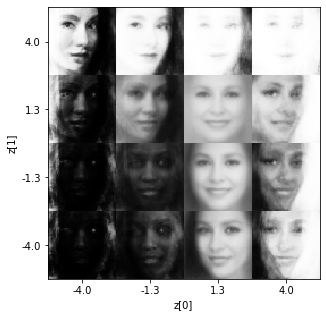

In [48]:
if __name__ == '__main__': 
    encoder, decoder, vae = build_vae()
    vae.compile(optimizer=Adam(lr=0.002)) 
    vae.summary()

    
    vae.fit(x_train, epochs=100, batch_size=64, 
            validation_data=(x_test, None),
            callbacks=[e_s, m_c],
            verbose=1)
    
    plot_generated_images(decoder)
    
#     plot_latent_distribution(encoder, x_test, y_test, batch_size=128) # batch size == 128

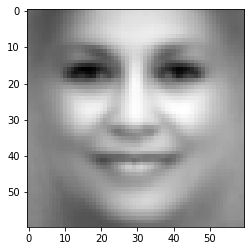

In [51]:
plt.imshow(vae.predict(np.random.uniform(.3, .7, dim*dim).reshape(1, -1)).reshape(dim, dim), cmap='gray')

In [175]:
n = 1_80
min_ = np.linspace(0.1, .7, n)
max_ = np.minimum(min_ + np.random.uniform(0.01, 0.02, n), .7)

In [176]:
def gen_samples(n, minimum, maximum):
        face = []
        for i in range(n):
            face.append(vae.predict(np.random.uniform(minimum, maximum, dim*dim).reshape(1, -1)).reshape(dim, dim))
        return face

In [177]:
for i in range(n):
    plt.figure(figsize=(4, 4))
    end = np.mean(gen_samples(n=50, minimum=min_[i], maximum=max_[i]), axis=0)
    plt.imshow(end, cmap='gray')
    plt.axis('off')
    plt.savefig('c:/users/nicolas/desktop/testevol/{}.jpg'.format(str(i)), 
                bbox_inches='tight', pad_inches = 0)
    plt.close()
    if (i+1) % 50 == 0:
        print(i+1, ' completed.')
print('Done.')

50  completed.
100  completed.
150  completed.
Done.


In [178]:
os.chdir('c:/users/nicolas/desktop/testevol')

In [179]:
import re
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ] 
    return sorted(data, key=alphanum_key)

In [180]:
png_dir = 'c:/users/nicolas/desktop/testevol'
images = []
for file_name in sorted_alphanumeric(os.listdir(png_dir))[:-20]:
    if file_name.endswith('.jpg'):
        file_path = os.path.join(png_dir, file_name)
        images.append(imageio.imread(file_path))
images.extend(images[::-1])     

In [181]:
imageio.mimsave('c:/users/nicolas/desktop/sickgif.gif', images, fps=60)

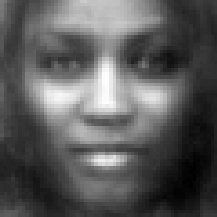

In [182]:
Img(filename='c:/users/nicolas/desktop/sickgif.gif')

In [25]:
vae.load_weights('vae_weights.hdf5')

ValueError: Shapes (784, 512) and (784, 784) are incompatible

In [143]:
# plot_latent_distribution(encoder, x_test, y_test, batch_size=128)

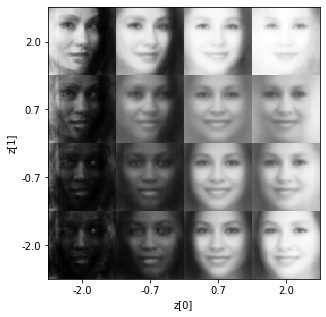

In [74]:
plot_generated_images(decoder)

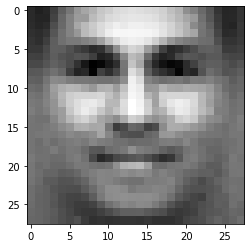

In [65]:
pred = vae.predict(np.random.rand(dim*dim).reshape(1, -1))
imr = plt.imshow(pred.reshape(dim, dim), cmap='gray')

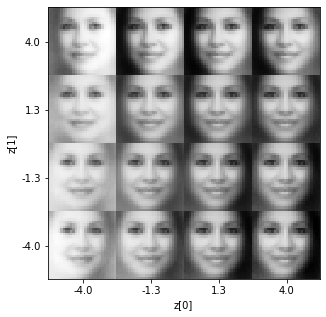

In [81]:
plot_generated_images(decoder)

In [137]:
plt.savefig('c:/users/nicolas/desktop.genfaces.jpg')

<Figure size 432x288 with 0 Axes>